In [29]:
# import pandas as pd
# import numpy as np
# import tables_io

import matplotlib.pyplot as plt
plt.style.use("/global/homes/s/sajkov/umap_nz_cal.mplstyle")

In [ ]:
embedding_path = "/pscratch/sd/s/sajkov/analysis_pipeline/runs/06Jul26_1p5kDataPoints_colors/informedEmbedding_UMAP_wSpecZs_06Jul26.pq"
EMBEDDING = tables_io.read(embedding_path).values

redshifts_path = "/pscratch/sd/s/sajkov/analysis_pipeline/runs/06Jul26_1p5kDataPoints_colors/TRUEREDSHIFTS_DeepField.npy"
REDSHIFTS = np.load(redshifts_path)

In [ ]:
np.shape(EMBEDDING)

In [ ]:
fig = plt.figure(figsize = (36, 16))
gs = fig.add_gridspec(1, 4, wspace = -0.22, hspace = -.25, left = 0.01, right = 0.93, bottom = 0.02, top = 0.98)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING[:, 2], EMBEDDING[:, 0], -EMBEDDING[:, 1], c = REDSHIFTS, s = 20,
            cmap = 'turbo', vmin = 0, vmax = 5)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Redshift')


# Fix UMAP training

# Pipeline v3 draft

In [2]:
# ----------------------------------------------------------------------------------------------- #
# Section 0: Setup                                                                                #
# ----------------------------------------------------------------------------------------------- #

print("Starting pipeline.")

### Set the date, start the timer
import time
date = "draft_UMAP_fix"
# date = time.strftime('%d%b%y', time.localtime())

def timestamp():
    return(f"[{time.strftime("%H:%M:%S", time.localtime())}]")

def timer(start_time, return_tuple = False):
    elapsed_time = time.time() - start_time

    hours = elapsed_time//3600
    minutes = (elapsed_time//60)%60
    seconds = elapsed_time - 3600 * hours - 60 * minutes
    
    if return_tuple:
        return (hours, minutes, seconds)
    
    if hours > 0:
        return f'{hours:.0f}h {minutes:.0f}m {seconds:.1f}s'
    
    if minutes > 0:
        return f'{minutes:.0f}m {seconds:.1f}s'
    
    return f'{seconds:.1f}s'

start_time = time.time()

print(timestamp(), "Started timer. Importing modules", )

### System imports
import sys, os, shutil
import glob

### I/O imports
import h5py
import tables_io
import pandas as pd

### Operations
import numpy as np

### RAIL imports
from rail.core.data import DataStore, PqHandle, ModelHandle
from rail.core.stage import RailStage

from MultiSurveyErrorModel import MultiSurveyErrorModel
from rail.estimation.algos.flexzboost import FlexZBoostInformer, FlexZBoostEstimator
# from UMAPEstimator import UMAPEstimator

print(timestamp(), "Finished importing modules. Time elapsed: ", timer(start_time))

### Initialize random state
seed = 42
rng = np.random.default_rng(seed = seed)

### Specify outputs directory
outputs_directory = f"/pscratch/sd/s/sajkov/analysis_pipeline/runs/{date}"
os.makedirs(outputs_directory, exist_ok = True)
    
# ----------------------------------------------------------------------------------------------- #
# Section 1: Create datasets                                                                      #
# ----------------------------------------------------------------------------------------------- #

print(timestamp(), "Creating datasets.")

### Specify path to noiseless catalog and redshifts
noiseless_catalog_filepath = "/pscratch/sd/s/sajkov/data/integrated_catalog_23apr26.pq"
redshifts_filepath = "/pscratch/sd/s/sajkov/data/mock_catalog_Ch1_26.h5"

DATASET_popCosmos_full   = tables_io.read(noiseless_catalog_filepath)
with h5py.File(redshifts_filepath) as simulated_catalog:
    REDSHIFTS_popCosmos_full = simulated_catalog['sps_parameters'][:, -1]

### Number of pop-cosmos sources to use in analysis
training_cut   = 10_000   ### Number of sources used to train the estimators
estimation_cut = 50_000   ### Number of sources for which to estimate redshifts

### Randomize full dataset indices
len_DATASET_popCosmos_full = len(DATASET_popCosmos_full)
RANDIDX_popCosmos_full = rng.choice(np.arange(len_DATASET_popCosmos_full),
                                    len_DATASET_popCosmos_full,
                                    replace = False)

RANDIDX_DeepField_full, RANDIDX_WideFastDeep_full = np.array_split(RANDIDX_popCosmos_full, 2)

### 5-sigma limiting depths ------------------
### LSST: median values for COSMOS deep field from https://usdf-maf.slac.stanford.edu/summaryStats?runId=5#Basics_Coadd%20M5
### Roman from https://github.com/jfcrenshaw/photerr/blob/a014b39729ddde3daf80be2dbe82f5a7f958882c/photerr/roman.py#L120-L126
### HSC Niji (60 min exposure) from https://sites.google.com/view/hsc-mb-survey3/filter-specification?authuser=0 
###
### Acessed June 3, 2026
### --------------------------------------------

M5_DEPTHS_DeepField = {'LSST_u'    : 27.74,
                      'LSST_g'    : 28.69,
                      'LSST_r'    : 28.88,
                      'LSST_i'    : 28.96,
                      'LSST_z'    : 28.26,
                      'LSST_y'    : 26.63,}
                    #   'Roman_F062': 27.7,
                    #   'Roman_F087': 27.7,
                    #   'Roman_F106': 27.6,
                    #   'Roman_F129': 27.5,
                    #   'Roman_F158': 27.0,
                    #   'Roman_F184': 25.9,
                    #   'Roman_F213': 28.3,}
                    #   'HSC_MB_00' : 26.41,
                    #   'HSC_MB_01' : 26.51,
                    #   'HSC_MB_02' : 26.45,
                    #   'HSC_MB_03' : 26.69,
                    #   'HSC_MB_04' : 26.93,
                    #   'HSC_MB_05' : 26.62,
                    #   'HSC_MB_06' : 26.26,
                    #   'HSC_MB_07' : 26.02,
                    #   'HSC_MB_08' : 26.07,
                    #   'HSC_MB_09' : 26.00,
                    #   'HSC_MB_10' : 26.06,
                    #   'HSC_MB_11' : 25.52,
                    #   'HSC_MB_12' : 25.58,
                    #   'HSC_MB_13' : 25.43,
                    #   'HSC_MB_14' : 25.15,
                    #   'HSC_MB_15' : 24.79}

iBandLimit_DeepField = 27

### 5-sigma limiting depths for WideFastDeep from https://usdf-maf.slac.stanford.edu/summaryStats?runId=5#Basics_Coadd%20M5
### Column `DD:WFD CoaddM5`
M5_DEPTHS_WideFastDeep = {'LSST_u'    : 25.61,
                          'LSST_g'    : 26.90,
                          'LSST_r'    : 26.87,
                          'LSST_i'    : 26.43,
                          'LSST_z'    : 25.73,
                          'LSST_y'    : 24.79}

iBandLimit_WideFastDeep = 25

### Get list of bands
BANDS_DeepField = list(M5_DEPTHS_DeepField.keys())
ERR_BANDS_DeepField = [f"{key}_err" for key in BANDS_DeepField]

BANDS_WideFastDeep = list(M5_DEPTHS_WideFastDeep.keys())
ERR_BANDS_WideFastDeep = [f"{key}_err" for key in BANDS_WideFastDeep]

### Select needed bands and pick out needed sources
PHOTOMETRY_DeepField_noiseless    = DATASET_popCosmos_full[BANDS_DeepField].iloc[RANDIDX_DeepField_full]
PHOTOMETRY_WideFastDeep_noiseless = DATASET_popCosmos_full[BANDS_WideFastDeep].iloc[RANDIDX_WideFastDeep_full]

### ### Apply noise

### Noising parameters

nYrObs     = 1 # one-year depths
nVisYr     = 1 # one visit/yr (i.e., no co-adds)
gamma      = 0.04
sigLim     = 1 #

seed = 42

### Create: deep, multi-band, medium-band photometry for use in LePhare

print(timestamp(), "Getting noisy deep field photometry in AB magnitudes.")

getNoisyDeepFieldPhotometry_AB = MultiSurveyErrorModel.make_stage(
    name = "getNoisyDeepFieldPhotometry_AB",
    
    inputType  = "pogson",
    outputType = "pogson",
    
    m5     = M5_DEPTHS_DeepField,
    bands  = BANDS_DeepField,
    nYrObs = nYrObs,
    nVisYr = nVisYr,
    gamma  = gamma,
    sigLim = sigLim,
    
    seed = seed
)

getNoisyDeepFieldPhotometry_AB.set_data("noiseless_catalog", PHOTOMETRY_DeepField_noiseless) 
getNoisyDeepFieldPhotometry_AB.run()
PHOTOMETRY_DeepField_noisy_AB_full = getNoisyDeepFieldPhotometry_AB.get_handle("noisy_catalog").data
getNoisyDeepFieldPhotometry_AB.finalize()

iBandCut_DeepField_noisy = PHOTOMETRY_DeepField_noisy_AB_full["LSST_i"] < 27
PHOTOMETRY_DeepField_noisy_AB_iBandCut = PHOTOMETRY_DeepField_noisy_AB_full[iBandCut_DeepField_noisy]
PHOTOMETRY_DeepField_noisy_AB_iBandCut_trainingCut = PHOTOMETRY_DeepField_noisy_AB_iBandCut.iloc[:training_cut]

PHOTOMETRY_DeepField_noisy_AB = PHOTOMETRY_DeepField_noisy_AB_iBandCut_trainingCut
PHOTOMETRY_DeepField_noisy_AB.to_parquet(f"{outputs_directory}/PHOTOMETRY_DeepField_noisy_AB_{date}.pq")

### Create: the same as above, but as a template-generating reference for LePhare

print(timestamp(), "Getting noisy deep field photometry in asinh.")

getNoisyDeepFieldPhotometry_asinh = MultiSurveyErrorModel.make_stage(
    name = "getNoisyDeepFieldPhotometry_asinh",
    
    inputType  = "pogson",
    outputType = "asinh",
    
    m5     = M5_DEPTHS_DeepField,
    bands  = BANDS_DeepField,
    nYrObs = nYrObs,
    nVisYr = nVisYr,
    gamma  = gamma,
    sigLim = 0,
    
    seed = seed
)

getNoisyDeepFieldPhotometry_asinh.set_data("noiseless_catalog", PHOTOMETRY_DeepField_noiseless) 
getNoisyDeepFieldPhotometry_asinh.run()
PHOTOMETRY_DeepField_noisy_asinh_full = getNoisyDeepFieldPhotometry_asinh.get_handle("noisy_catalog").data
getNoisyDeepFieldPhotometry_asinh.finalize()

PHOTOMETRY_DeepField_noisy_asinh_iBandCut = PHOTOMETRY_DeepField_noisy_asinh_full[iBandCut_DeepField_noisy]
PHOTOMETRY_DeepField_noisy_asinh_iBandCut_trainingCut = PHOTOMETRY_DeepField_noisy_asinh_iBandCut.iloc[:training_cut]

PHOTOMETRY_DeepField_noisy_asinh = PHOTOMETRY_DeepField_noisy_asinh_iBandCut_trainingCut
PHOTOMETRY_DeepField_noisy_asinh.to_parquet(f"{outputs_directory}/PHOTOMETRY_DeepField_noisy_asinh_{date}.pq")

### Create: LSST-like photometry

print(timestamp(), "Getting noisy WideFastDeep photometry in AB magnitudes.")

getNoisyWideFastDeepPhotometry_AB = MultiSurveyErrorModel.make_stage(
    name = "getNoisyWideFastDeepPhotometry_AB",
    
    inputType  = "pogson",
    outputType = "pogson",
    
    m5     = M5_DEPTHS_WideFastDeep,
    bands  = BANDS_WideFastDeep,
    nYrObs = nYrObs,
    nVisYr = nVisYr,
    gamma  = gamma,
    sigLim = sigLim,
    
    seed = seed
)

getNoisyWideFastDeepPhotometry_AB.set_data("noiseless_catalog", PHOTOMETRY_WideFastDeep_noiseless) 
getNoisyWideFastDeepPhotometry_AB.run()
PHOTOMETRY_WideFastDeep_noisy_AB_full = getNoisyWideFastDeepPhotometry_AB.get_handle("noisy_catalog").data
getNoisyWideFastDeepPhotometry_AB.finalize()

iBandCut_WideFastDeep_noisy = PHOTOMETRY_WideFastDeep_noisy_AB_full["LSST_i"] < 25
PHOTOMETRY_WideFastDeep_noisy_AB_iBandCut = PHOTOMETRY_WideFastDeep_noisy_AB_full[iBandCut_WideFastDeep_noisy]
PHOTOMETRY_WideFastDeep_noisy_AB_iBandCut_trainingCut = PHOTOMETRY_WideFastDeep_noisy_AB_iBandCut.iloc[:estimation_cut]

PHOTOMETRY_WideFastDeep_noisy_AB = PHOTOMETRY_WideFastDeep_noisy_AB_iBandCut_trainingCut
PHOTOMETRY_WideFastDeep_noisy_AB.to_parquet(f"{outputs_directory}/PHOTOMETRY_WideFastDeep_noisy_AB_{date}.pq")

print(timestamp(), "Getting noisy WideFastDeep photometry in asinh magnitudes.")

getNoisyWideFastDeepPhotometry_asinh = MultiSurveyErrorModel.make_stage(
    name = "getNoisyWideFastDeepPhotometry_asinh",
    
    inputType  = "pogson",
    outputType = "asinh",
    
    m5     = M5_DEPTHS_WideFastDeep,
    bands  = BANDS_WideFastDeep,
    nYrObs = nYrObs,
    nVisYr = nVisYr,
    gamma  = gamma,
    sigLim = 0,
    
    seed = seed
)

getNoisyWideFastDeepPhotometry_asinh.set_data("noiseless_catalog", PHOTOMETRY_WideFastDeep_noiseless) 
getNoisyWideFastDeepPhotometry_asinh.run()
PHOTOMETRY_WideFastDeep_noisy_asinh_full = getNoisyWideFastDeepPhotometry_asinh.get_handle("noisy_catalog").data
getNoisyWideFastDeepPhotometry_asinh.finalize()

iBandCut_WideFastDeep_noisy = PHOTOMETRY_WideFastDeep_noisy_asinh_full["LSST_i"] < 25
PHOTOMETRY_WideFastDeep_noisy_asinh_iBandCut = PHOTOMETRY_WideFastDeep_noisy_asinh_full[iBandCut_WideFastDeep_noisy]
PHOTOMETRY_WideFastDeep_noisy_asinh_iBandCut_trainingCut = PHOTOMETRY_WideFastDeep_noisy_asinh_iBandCut.iloc[:estimation_cut]

PHOTOMETRY_WideFastDeep_noisy_asinh = PHOTOMETRY_WideFastDeep_noisy_asinh_iBandCut_trainingCut
PHOTOMETRY_WideFastDeep_noisy_asinh.to_parquet(f"{outputs_directory}/PHOTOMETRY_WideFastDeep_noisy_asinh_{date}.pq")

### Get source indices
IDX_popCosmos_DeepField             = list(PHOTOMETRY_DeepField_noisy_AB.index)
IDX_popCosmos_WideFastDeep          = list(PHOTOMETRY_WideFastDeep_noisy_AB.index)

### Select relevant redshifts
REDSHIFTS_DeepField                = REDSHIFTS_popCosmos_full[IDX_popCosmos_DeepField]
REDSHIFTS_WideFastDeep             = REDSHIFTS_popCosmos_full[IDX_popCosmos_WideFastDeep]

np.save(f"{outputs_directory}/TRUEREDSHIFTS_DeepField",             REDSHIFTS_DeepField,             allow_pickle = True)   
np.save(f"{outputs_directory}/TRUEREDSHIFTS_WideFastDeep",          REDSHIFTS_WideFastDeep,          allow_pickle = True)         

PHOTOMETRY_DeepField_noisy_AB             = PHOTOMETRY_DeepField_noisy_AB.replace(np.inf, np.nan)
PHOTOMETRY_WideFastDeep_noisy_AB          = PHOTOMETRY_WideFastDeep_noisy_AB.replace(np.inf, np.nan)

print(timestamp(), "Finished creating datasets. Time elapsed: ", timer(start_time))

print("------------ Length of datasets ------------")
print(f"Deep field (AB):                    {len(PHOTOMETRY_DeepField_noisy_AB)}")
print(f"Deep field (asinh):                 {len(PHOTOMETRY_DeepField_noisy_asinh)}")
print(f"WideFastDeep field (AB):            {len(PHOTOMETRY_WideFastDeep_noisy_AB)}")
print(f"WideFastDeep field (asinh):         {len(PHOTOMETRY_WideFastDeep_noisy_asinh)}")
print("--------------------------------------------")

Starting pipeline.
[15:16:36] Started timer. Importing modules
[15:16:41] Finished importing modules. Time elapsed:  4.5s
[15:16:41] Creating datasets.
column_list None
[15:16:42] Getting noisy deep field photometry in AB magnitudes.
2026-07-08 15:16:42 [info     ] Inserting handle into data store.  noiseless_catalog: None, getNoisyDeepFieldPhotometry_AB
2026-07-08 15:16:44 [info     ] Inserting handle into data store.  noisy_catalog_getNoisyDeepFieldPhotometry_AB: inprogress_noisy_catalog_getNoisyDeepFieldPhotometry_AB.pq, getNoisyDeepFieldPhotometry_AB
[15:16:44] Getting noisy deep field photometry in asinh.
2026-07-08 15:16:44 [info     ] Inserting handle into data store.  noiseless_catalog: None, getNoisyDeepFieldPhotometry_asinh
2026-07-08 15:16:47 [info     ] Inserting handle into data store.  noisy_catalog_getNoisyDeepFieldPhotometry_asinh: inprogress_noisy_catalog_getNoisyDeepFieldPhotometry_asinh.pq, getNoisyDeepFieldPhotometry_asinh
[15:16:47] Getting noisy WideFastDeep photo

In [3]:
from UMAPEstimator import UMAPEstimator

In [4]:
TRAINING_DATA_UMAP = PHOTOMETRY_DeepField_noisy_asinh

TRAINING_PHOTOMETRY_UMAP = TRAINING_DATA_UMAP[BANDS_WideFastDeep]
TRAINING_PHOTOMERRS_UMAP = TRAINING_DATA_UMAP[ERR_BANDS_WideFastDeep]

TRAINING_REDSHIFTS_UMAP_specZs  = REDSHIFTS_DeepField


ESTIMATION_DATA_UMAP = PHOTOMETRY_WideFastDeep_noisy_asinh

ESTIMATION_PHOTOMETRY_UMAP = ESTIMATION_DATA_UMAP[BANDS_WideFastDeep]
ESTIMATION_PHOTOMERRS_UMAP = ESTIMATION_DATA_UMAP[ERR_BANDS_WideFastDeep]


In [5]:
COLORNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

COLERRNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}_err"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

In [6]:
TRAINING_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

TRAINING_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

In [7]:

ESTIMATION_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

In [8]:
### Set UMAP parameters
ambient_metric_umap = "manhattan_weighted_linear"
n_neighbors_umap    = 80
min_dist            = 0.0

n_neighbors_knn = 10
metric_p_knn   = 2

precision_gauss_kde = 0.01
seed = 42

estimatePhotozsUMAP_wSpecZs = UMAPEstimator.make_stage(
    name = "estimatePhotozsUMAP_wSpecZs",
    
    ### Specify UMAP parameters
    ambient_metric_umap = ambient_metric_umap,
    
    n_neighbors_umap = n_neighbors_umap,
    min_dist         = min_dist,
    
    n_neighbors_knn = n_neighbors_knn,
    metric_p_knn    = metric_p_knn,
    
    precision_gauss_kde = precision_gauss_kde,
    
    seed = seed
)

estimatePhotozsUMAP_wSpecZs.set_data("training_photometry", data = TRAINING_COLORS_UMAP)
estimatePhotozsUMAP_wSpecZs.set_data("training_phot_error", data = TRAINING_COLERRS_UMAP)
estimatePhotozsUMAP_wSpecZs.set_data("training_redshift",   data = TRAINING_REDSHIFTS_UMAP_specZs)

estimatePhotozsUMAP_wSpecZs.UMAP_informer()


2026-07-08 15:18:58 [info     ] Inserting handle into data store.  training_photometry: None, estimatePhotozsUMAP_wSpecZs
2026-07-08 15:18:58 [info     ] Inserting handle into data store.  training_phot_error: None, estimatePhotozsUMAP_wSpecZs
2026-07-08 15:18:58 [info     ] Inserting handle into data store.  training_redshift: None, estimatePhotozsUMAP_wSpecZs


/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1857: UserWarning: custom distance metric does not return gradient; inverse_transform will be unavailable. To enable using inverse_transform method, define a distance function that returns a tuple of (distance [float], gradient [np.array])
  warn(
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


2026-07-08 15:19:40 [info     ] Inserting handle into data store.  informed_reducer_estimatePhotozsUMAP_wSpecZs: inprogress_informed_reducer_estimatePhotozsUMAP_wSpecZs.pkl, estimatePhotozsUMAP_wSpecZs
2026-07-08 15:19:40 [info     ] Inserting handle into data store.  informed_embedding_estimatePhotozsUMAP_wSpecZs: inprogress_informed_embedding_estimatePhotozsUMAP_wSpecZs.pq, estimatePhotozsUMAP_wSpecZs
2026-07-08 15:19:40 [info     ] Inserting handle into data store.  informed_kNN_regressor_estimatePhotozsUMAP_wSpecZs: inprogress_informed_kNN_regressor_estimatePhotozsUMAP_wSpecZs.pkl, estimatePhotozsUMAP_wSpecZs


In [9]:
estimatePhotozsUMAP_wSpecZs.set_data("estimation_photometry", data = ESTIMATION_COLORS_UMAP)
estimatePhotozsUMAP_wSpecZs.set_data("estimation_phot_error", data = ESTIMATION_COLERRS_UMAP)
estimatePhotozsUMAP_wSpecZs.UMAP_estimator()

2026-07-08 15:20:07 [info     ] Inserting handle into data store.  estimation_photometry: None, estimatePhotozsUMAP_wSpecZs
2026-07-08 15:20:07 [info     ] Inserting handle into data store.  estimation_phot_error: None, estimatePhotozsUMAP_wSpecZs


In [10]:
EMBEDDING_informed = estimatePhotozsUMAP_wSpecZs.get_handle("informed_embedding").data.values
REDSHIFTS_informed = REDSHIFTS_DeepField

EMBEDDING_estimated = estimatePhotozsUMAP_wSpecZs.get_handle("estimated_embedding").data.values
REDSHIFTS_estimated = estimatePhotozsUMAP_wSpecZs.get_handle("estimated_photoz_medians").data

Text(0.4, 0.47, 'Estimated embedding')

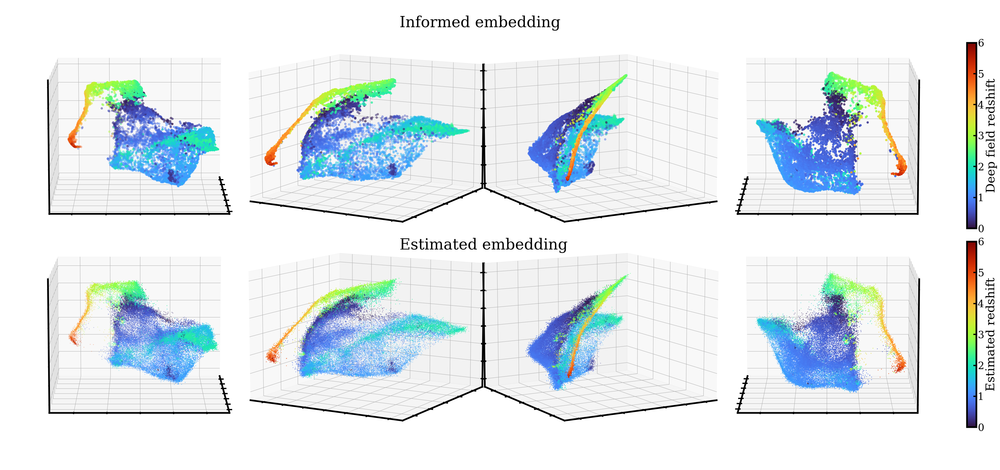

In [11]:
fig = plt.figure(figsize = (36, 16))
gs = fig.add_gridspec(2, 4, wspace = -0.22, hspace = -.25, left = 0.01, right = 0.93, bottom = 0.02, top = 0.98)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_informed[:, 2], EMBEDDING_informed[:, 0], -EMBEDDING_informed[:, 1],
                          c = REDSHIFTS_informed, s = 20,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Deep field redshift')
fig.text(0.4, 0.93, 'Informed embedding', fontsize = 36)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[1, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_estimated[:, 2], EMBEDDING_estimated[:, 0], -EMBEDDING_estimated[:, 1],
                          c = REDSHIFTS_estimated, s = 0.5,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Estimated redshift')
fig.text(0.4, 0.47, 'Estimated embedding', fontsize = 36)

# fig.savefig('/Users/leo/Projects/umap_nz_cal/figures/build_UMAP/comparison_w_Ashmead/UMAP_photom.png', bbox_inches = 'tight', dpi = 150)

In [ ]:
EMBEDDING_informed

In [ ]:
EMBEDDING_estimated

In [15]:
def outlier_frac(z_pred, z_true):
    
    delta_z = z_pred - z_true
    
    return (np.abs(delta_z)/(1 + z_true) > 0.15).sum()/len(delta_z)

def sigma_nmad(z_pred, z_true):
    
    delta_z = z_pred - z_true
    
    return 1.4826 * np.median(np.abs((delta_z/(1 + z_true)) - np.median(delta_z/(1 + z_true))))
    
def prediction_bias(z_pred, z_true):
    
    delta_z = z_pred - z_true
    
    return np.mean(delta_z/(1 + z_true))

In [16]:
print("Outlier frac", outlier_frac(REDSHIFTS_estimated["z_phot_median"].values, REDSHIFTS_WideFastDeep))
print("Sigma NMAD", sigma_nmad(REDSHIFTS_estimated["z_phot_median"].values, REDSHIFTS_WideFastDeep))
print("Prediction bias", prediction_bias(REDSHIFTS_estimated["z_phot_median"].values, REDSHIFTS_WideFastDeep))

Outlier frac 0.71388
Sigma NMAD 0.4335763346616349
Prediction bias 0.15036936991651567


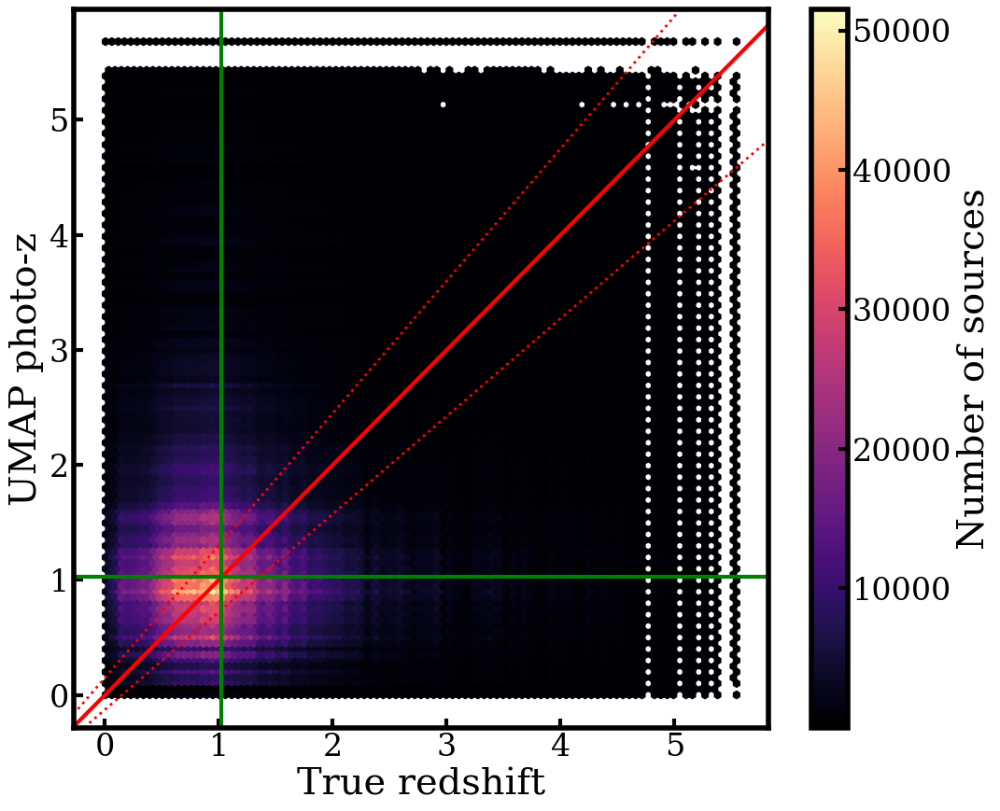

In [17]:
fig = plt.figure()
ax = fig.add_subplot()


mappable = ax.hexbin(REDSHIFTS_WideFastDeep[::10], REDSHIFTS_estimated[::10],
          mincnt = 1)

ax.set_xlabel("True redshift")
ax.set_ylabel("UMAP photo-z")

ax.axline((0, 0), slope = 1, color = "red")
ax.axline((0.15, 0), slope = .85,  color = "red", linestyle = ":", linewidth = 2)
ax.axline((0, 0.15), slope = 1.15, color = "red", linestyle = ":", linewidth = 2)

ax.axhline(np.median(REDSHIFTS_WideFastDeep[::10]), color = 'green')
ax.axvline(np.median(REDSHIFTS_WideFastDeep[::10]), color = 'green')

fig.colorbar(mappable = mappable, label = "Number of sources")

In [18]:
from sklearn.neighbors import NearestNeighbors


In [19]:
n_neighbors = 10
knn = NearestNeighbors(n_neighbors = n_neighbors, metric = 'euclidean')
knn.fit(EMBEDDING_informed)

,"n_neighbors n_neighbors: int, default=5Number of neighbors to use by default for :meth:`kneighbors` queries.",10
,"metric metric: str or callable, default='minkowski'Metric to use for distance computation. Default is ""minkowski"", whichresults in the standard Euclidean distance when p = 2. See thedocumentation of `scipy.spatial.distance<https://docs.scipy.org/doc/scipy/reference/spatial.distance.html>`_ andthe metrics listed in:class:`~sklearn.metrics.pairwise.distance_metrics` for valid metricvalues.If metric is ""precomputed"", X is assumed to be a distance matrix andmust be square during fit. X may be a :term:`sparse graph`, in whichcase only ""nonzero"" elements may be considered neighbors.If metric is a callable function, it takes two arrays representing 1Dvectors as inputs and must return one value indicating the distancebetween those vectors. This works for Scipy's metrics, but is lessefficient than passing the metric name as a string.",'euclidean'
,"radius radius: float, default=1.0Range of parameter space to use by default for :meth:`radius_neighbors`queries.",1.0
,"algorithm algorithm: {'auto', 'ball_tree', 'kd_tree', 'brute'}, default='auto'Algorithm used to compute the nearest neighbors:- 'ball_tree' will use :class:`BallTree`- 'kd_tree' will use :class:`KDTree`- 'brute' will use a brute-force search.- 'auto' will attempt to decide the most appropriate algorithm based on the values passed to :meth:`fit` method.Note: fitting on sparse input will override the setting ofthis parameter, using brute force.",'auto'
,"leaf_size leaf_size: int, default=30Leaf size passed to BallTree or KDTree. This can affect thespeed of the construction and query, as well as the memoryrequired to store the tree. The optimal value depends on thenature of the problem.",30
,"p p: float (positive), default=2Parameter for the Minkowski metric fromsklearn.metrics.pairwise.pairwise_distances. When p = 1, this isequivalent to using manhattan_distance (l1), and euclidean_distance(l2) for p = 2. For arbitrary p, minkowski_distance (l_p) is used.",2
,"metric_params metric_params: dict, default=NoneAdditional keyword arguments for the metric function.",None
,"n_jobs n_jobs: int, default=NoneThe number of parallel jobs to run for neighbors search.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details.",None
Name,Type,Value
effective_metric_ effective_metric_: strMetric used to compute distances to neighbors.,str,'eu...an'
effective_metric_params_ effective_metric_params_: dictParameters for the metric used to compute distances to neighbors.,dict,{}


In [20]:
distances, indices = knn.kneighbors(EMBEDDING_estimated)

In [23]:
photozs = np.array([np.median(REDSHIFTS_DeepField[indices[ii]]) for ii in range(len(indices))])

In [25]:
print("Outlier frac", outlier_frac(photozs, REDSHIFTS_WideFastDeep))
print("Sigma NMAD", sigma_nmad(photozs, REDSHIFTS_WideFastDeep))
print("Prediction bias", prediction_bias(photozs, REDSHIFTS_WideFastDeep))

Outlier frac 0.70994
Sigma NMAD 0.4240024
Prediction bias 0.13658988


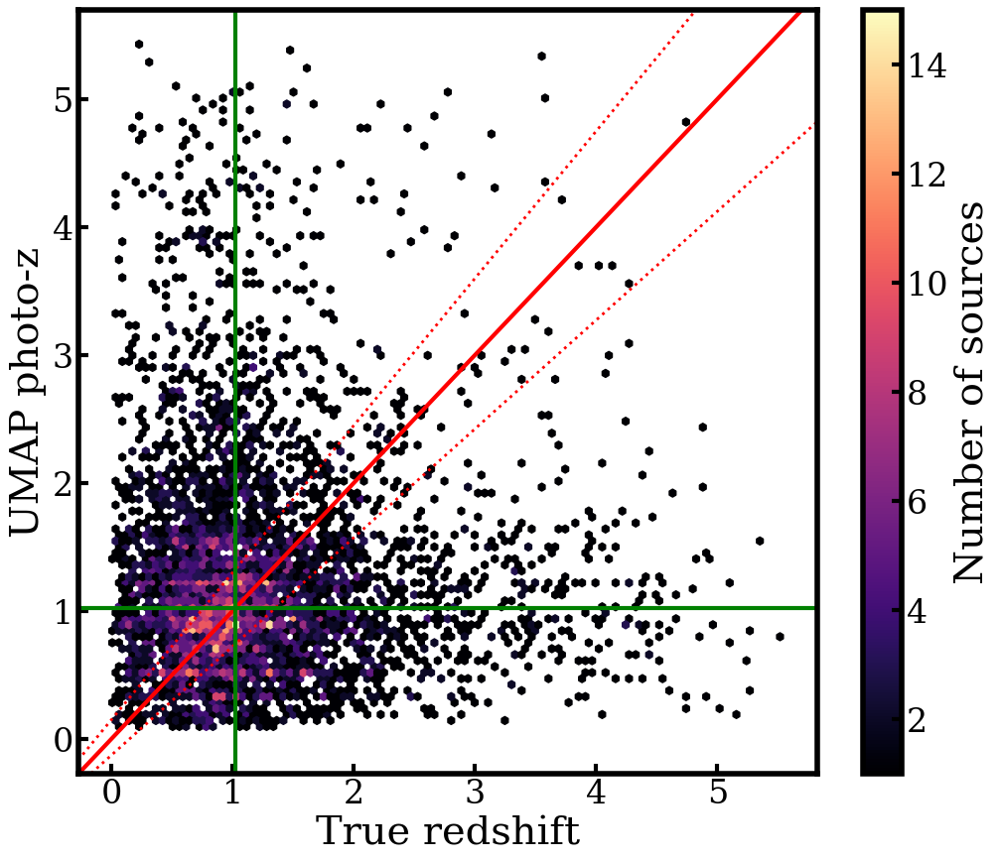

In [24]:
fig = plt.figure()
ax = fig.add_subplot()


mappable = ax.hexbin(REDSHIFTS_WideFastDeep[::10], photozs[::10],
          mincnt = 1)

ax.set_xlabel("True redshift")
ax.set_ylabel("UMAP photo-z")

ax.axline((0, 0), slope = 1, color = "red")
ax.axline((0.15, 0), slope = .85,  color = "red", linestyle = ":", linewidth = 2)
ax.axline((0, 0.15), slope = 1.15, color = "red", linestyle = ":", linewidth = 2)

ax.axhline(np.median(REDSHIFTS_WideFastDeep[::10]), color = 'green')
ax.axvline(np.median(REDSHIFTS_WideFastDeep[::10]), color = 'green')

fig.colorbar(mappable = mappable, label = "Number of sources")

___

# Experiment: build the embedding with WFD sources
Maybe, we need to degrade the deep photometry to match the photometry of the galaxies we will be esimating redshifts for

In [1]:
ESTIMATION_COLORS_UMAP[:10000]

NameError: name 'ESTIMATION_COLORS_UMAP' is not defined

In [30]:

UMAP_wWFDsources = UMAPEstimator.make_stage(
    name = "UMAP_wWFDsources",
    
    ### Specify UMAP parameters
    ambient_metric_umap = ambient_metric_umap,
    
    n_neighbors_umap = n_neighbors_umap,
    min_dist         = min_dist,
    
    n_neighbors_knn = n_neighbors_knn,
    metric_p_knn    = metric_p_knn,
    
    precision_gauss_kde = precision_gauss_kde,
    
    seed = seed
)

UMAP_wWFDsources.set_data("training_photometry", data = ESTIMATION_COLORS_UMAP[:10000])
UMAP_wWFDsources.set_data("training_phot_error", data = ESTIMATION_COLERRS_UMAP[:10000])
UMAP_wWFDsources.set_data("training_redshift",   data = REDSHIFTS_WideFastDeep[:10000])

UMAP_wWFDsources.UMAP_informer()


2026-07-08 15:35:00 [info     ] Inserting handle into data store.  training_photometry: None, UMAP_wWFDsources
2026-07-08 15:35:00 [info     ] Inserting handle into data store.  training_phot_error: None, UMAP_wWFDsources
2026-07-08 15:35:00 [info     ] Inserting handle into data store.  training_redshift: None, UMAP_wWFDsources


/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1857: UserWarning: custom distance metric does not return gradient; inverse_transform will be unavailable. To enable using inverse_transform method, define a distance function that returns a tuple of (distance [float], gradient [np.array])
  warn(
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


2026-07-08 15:35:24 [info     ] Inserting handle into data store.  informed_reducer_UMAP_wWFDsources: inprogress_informed_reducer_UMAP_wWFDsources.pkl, UMAP_wWFDsources
2026-07-08 15:35:24 [info     ] Inserting handle into data store.  informed_embedding_UMAP_wWFDsources: inprogress_informed_embedding_UMAP_wWFDsources.pq, UMAP_wWFDsources
2026-07-08 15:35:24 [info     ] Inserting handle into data store.  informed_kNN_regressor_UMAP_wWFDsources: inprogress_informed_kNN_regressor_UMAP_wWFDsources.pkl, UMAP_wWFDsources


In [31]:
UMAP_wWFDsources.set_data("estimation_photometry", data = ESTIMATION_COLORS_UMAP[10000:])
UMAP_wWFDsources.set_data("estimation_phot_error", data = ESTIMATION_COLERRS_UMAP[10000:])
UMAP_wWFDsources.UMAP_estimator()

2026-07-08 15:35:28 [info     ] Inserting handle into data store.  estimation_photometry: None, UMAP_wWFDsources
2026-07-08 15:35:28 [info     ] Inserting handle into data store.  estimation_phot_error: None, UMAP_wWFDsources


/global/u1/s/sajkov/UMAPsWithPhotozs/UMAPEstimator.py:194: RuntimeWarning: invalid value encountered in divide
  photoz_cdfs /= photoz_cdfs[:, -1:]
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:187: UserWarning: The distributions at indices = [14257] have an integral of 0.
  warnings.warn(
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:207: RuntimeWarning: invalid value encountered in divide
  new_yvals = (self._yvals.T / self._ycumul[:, -1]).T
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:208: RuntimeWarning: invalid value encountered in divide
  self._ycumul = (self._ycumul.T / self._ycumul[:, -1]).T
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:140: RuntimeWarning: There are non-finite values in the yvals for the following distributions: (array([14257, 142

2026-07-08 15:37:06 [info     ] Inserting handle into data store.  estimated_embedding_UMAP_wWFDsources: inprogress_estimated_embedding_UMAP_wWFDsources.pq, UMAP_wWFDsources
2026-07-08 15:37:06 [info     ] Inserting handle into data store.  estimated_photoz_medians_UMAP_wWFDsources: inprogress_estimated_photoz_medians_UMAP_wWFDsources.pq, UMAP_wWFDsources
2026-07-08 15:37:06 [info     ] Inserting handle into data store.  estimated_photoz_pdfs_UMAP_wWFDsources: inprogress_estimated_photoz_pdfs_UMAP_wWFDsources.hdf5, UMAP_wWFDsources


In [32]:
EMBEDDING_informed_WFD = UMAP_wWFDsources.get_handle("informed_embedding").data.values
REDSHIFTS_informed_WFD = REDSHIFTS_WideFastDeep[:10000]

EMBEDDING_estimated_WFD = UMAP_wWFDsources.get_handle("estimated_embedding").data.values
REDSHIFTS_estimated_WFD = UMAP_wWFDsources.get_handle("estimated_photoz_medians").data

In [35]:
REDSHIFTS_estimated_WFD['z_phot_median'].values

array([1.08, 1.11, 0.63, ..., 1.97, 2.67, 0.57], shape=(40000,))

In [38]:
print("Outlier frac", outlier_frac(REDSHIFTS_estimated_WFD['z_phot_median'].values, REDSHIFTS_WideFastDeep[10000:]))
print("Sigma NMAD", sigma_nmad(REDSHIFTS_estimated_WFD['z_phot_median'].values, REDSHIFTS_WideFastDeep[10000:]))
print("Prediction bias", prediction_bias(REDSHIFTS_estimated_WFD['z_phot_median'].values, REDSHIFTS_WideFastDeep[10000:]))

Outlier frac 0.7155
Sigma NMAD 0.43299802675414134
Prediction bias 0.17704763020652778


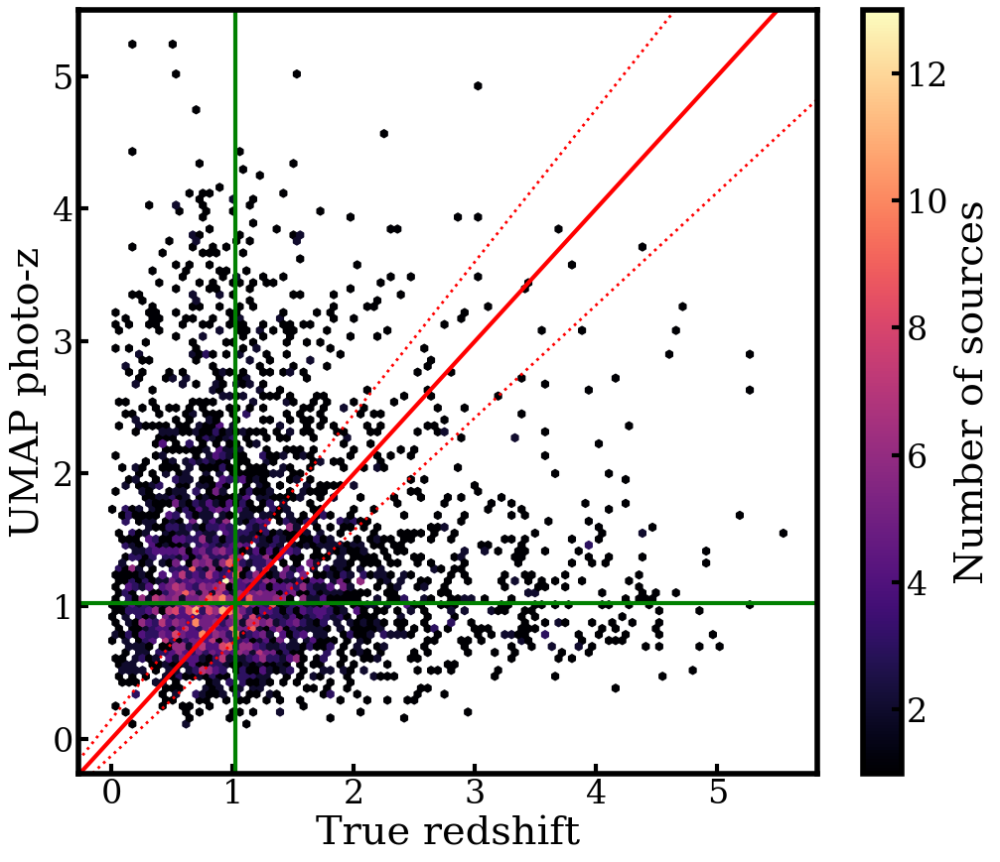

In [41]:
fig = plt.figure()
ax = fig.add_subplot()


mappable = ax.hexbin(REDSHIFTS_WideFastDeep[10000::10], REDSHIFTS_estimated_WFD['z_phot_median'].values[::10],
          mincnt = 1)

ax.set_xlabel("True redshift")
ax.set_ylabel("UMAP photo-z")

ax.axline((0, 0), slope = 1, color = "red")
ax.axline((0.15, 0), slope = .85,  color = "red", linestyle = ":", linewidth = 2)
ax.axline((0, 0.15), slope = 1.15, color = "red", linestyle = ":", linewidth = 2)

ax.axhline(np.median(REDSHIFTS_WideFastDeep[::10]), color = 'green')
ax.axvline(np.median(REDSHIFTS_WideFastDeep[::10]), color = 'green')

fig.colorbar(mappable = mappable, label = "Number of sources")

Text(0.4, 0.47, 'Estimated embedding')

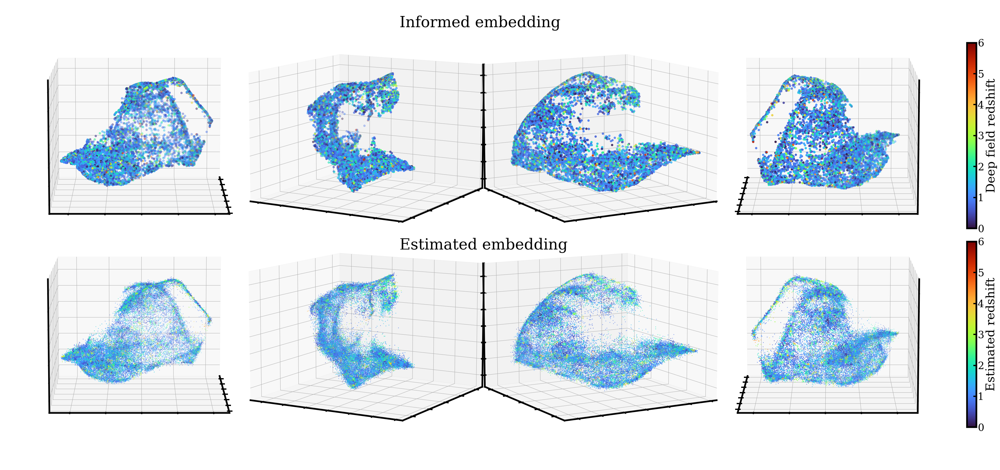

In [42]:
fig = plt.figure(figsize = (36, 16))
gs = fig.add_gridspec(2, 4, wspace = -0.22, hspace = -.25, left = 0.01, right = 0.93, bottom = 0.02, top = 0.98)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_informed_WFD[:, 2], EMBEDDING_informed_WFD[:, 0], -EMBEDDING_informed_WFD[:, 1],
                          c = REDSHIFTS_informed_WFD, s = 20,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Deep field redshift')
fig.text(0.4, 0.93, 'Informed embedding', fontsize = 36)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[1, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_estimated_WFD[:, 2], EMBEDDING_estimated_WFD[:, 0], -EMBEDDING_estimated_WFD[:, 1],
                          c = REDSHIFTS_estimated_WFD, s = 0.5,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Estimated redshift')
fig.text(0.4, 0.47, 'Estimated embedding', fontsize = 36)

# fig.savefig('/Users/leo/Projects/umap_nz_cal/figures/build_UMAP/comparison_w_Ashmead/UMAP_photom.png', bbox_inches = 'tight', dpi = 150)

___

# Experiment: build the UMAP with AB magntiudes instead of asinh

In [43]:

ESTIMATION_COLORS_UMAP_AB = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        PHOTOMETRY_WideFastDeep_noisy_AB[BANDS_WideFastDeep[i]] - PHOTOMETRY_WideFastDeep_noisy_AB[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLERRS_UMAP_AB = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(PHOTOMETRY_WideFastDeep_noisy_AB[ERR_BANDS_WideFastDeep[i]]**2 + PHOTOMETRY_WideFastDeep_noisy_AB[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

In [60]:
NONnanIDX_UMAP_AB = np.prod(~np.isnan(ESTIMATION_COLORS_UMAP_AB), axis = 1) == 1

In [64]:

UMAP_wWFDsources_AB = UMAPEstimator.make_stage(
    name = "UMAP_wWFDsources_AB",
    
    ### Specify UMAP parameters
    ambient_metric_umap = ambient_metric_umap,
    
    n_neighbors_umap = n_neighbors_umap,
    min_dist         = min_dist,
    
    n_neighbors_knn = n_neighbors_knn,
    metric_p_knn    = metric_p_knn,
    
    precision_gauss_kde = precision_gauss_kde,
    
    seed = seed
)

UMAP_wWFDsources_AB.set_data("training_photometry", data = ESTIMATION_COLORS_UMAP_AB[NONnanIDX_UMAP_AB][:10000])
UMAP_wWFDsources_AB.set_data("training_phot_error", data = ESTIMATION_COLERRS_UMAP_AB[NONnanIDX_UMAP_AB][:10000])
UMAP_wWFDsources_AB.set_data("training_redshift",   data = REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][:10000])

UMAP_wWFDsources_AB.UMAP_informer()


2026-07-08 15:50:48 [info     ] Inserting handle into data store.  training_photometry: None, UMAP_wWFDsources_AB
2026-07-08 15:50:48 [info     ] Inserting handle into data store.  training_phot_error: None, UMAP_wWFDsources_AB
2026-07-08 15:50:48 [info     ] Inserting handle into data store.  training_redshift: None, UMAP_wWFDsources_AB


/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1857: UserWarning: custom distance metric does not return gradient; inverse_transform will be unavailable. To enable using inverse_transform method, define a distance function that returns a tuple of (distance [float], gradient [np.array])
  warn(
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


2026-07-08 15:51:13 [info     ] Inserting handle into data store.  informed_reducer_UMAP_wWFDsources_AB: inprogress_informed_reducer_UMAP_wWFDsources_AB.pkl, UMAP_wWFDsources_AB
2026-07-08 15:51:13 [info     ] Inserting handle into data store.  informed_embedding_UMAP_wWFDsources_AB: inprogress_informed_embedding_UMAP_wWFDsources_AB.pq, UMAP_wWFDsources_AB
2026-07-08 15:51:13 [info     ] Inserting handle into data store.  informed_kNN_regressor_UMAP_wWFDsources_AB: inprogress_informed_kNN_regressor_UMAP_wWFDsources_AB.pkl, UMAP_wWFDsources_AB


In [65]:
UMAP_wWFDsources_AB.set_data("estimation_photometry", data = ESTIMATION_COLORS_UMAP_AB[NONnanIDX_UMAP_AB][10000:])
UMAP_wWFDsources_AB.set_data("estimation_phot_error", data = ESTIMATION_COLERRS_UMAP_AB[NONnanIDX_UMAP_AB][10000:])
UMAP_wWFDsources_AB.UMAP_estimator()

2026-07-08 15:51:51 [info     ] Inserting handle into data store.  estimation_photometry: None, UMAP_wWFDsources_AB
2026-07-08 15:51:51 [info     ] Inserting handle into data store.  estimation_phot_error: None, UMAP_wWFDsources_AB


/global/u1/s/sajkov/UMAPsWithPhotozs/UMAPEstimator.py:194: RuntimeWarning: invalid value encountered in divide
  photoz_cdfs /= photoz_cdfs[:, -1:]
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:187: UserWarning: The distributions at indices = [  244   774  1706  3173  4576  5106  6374  8519  9008  9102 11056 11342
 13048 13177 13358 14983 16074 16596 17274 19759 19789 20624 20895 22421
 22890 24069 24159 25185 26031 26248 27107 27536 27571 30314 31126 31193
 33650 34793] have an integral of 0.
  warnings.warn(
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:207: RuntimeWarning: invalid value encountered in divide
  new_yvals = (self._yvals.T / self._ycumul[:, -1]).T
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/qp/parameterizations/interp/interp.py:208: RuntimeWarning: invalid value encountered in divide
  self._ycumul = (self._ycumul.T / self._ycumul[:,

2026-07-08 15:53:18 [info     ] Inserting handle into data store.  estimated_embedding_UMAP_wWFDsources_AB: inprogress_estimated_embedding_UMAP_wWFDsources_AB.pq, UMAP_wWFDsources_AB
2026-07-08 15:53:18 [info     ] Inserting handle into data store.  estimated_photoz_medians_UMAP_wWFDsources_AB: inprogress_estimated_photoz_medians_UMAP_wWFDsources_AB.pq, UMAP_wWFDsources_AB
2026-07-08 15:53:18 [info     ] Inserting handle into data store.  estimated_photoz_pdfs_UMAP_wWFDsources_AB: inprogress_estimated_photoz_pdfs_UMAP_wWFDsources_AB.hdf5, UMAP_wWFDsources_AB


In [69]:
EMBEDDING_informed_WDF_AB = UMAP_wWFDsources_AB.get_handle("informed_embedding").data.values
REDSHIFTS_informed_WDF_AB = REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][:10000]

EMBEDDING_estimated_WDF_AB = UMAP_wWFDsources_AB.get_handle("estimated_embedding").data.values
REDSHIFTS_estimated_WDF_AB = UMAP_wWFDsources_AB.get_handle("estimated_photoz_medians").data["z_phot_median"].values

In [71]:
print("Outlier frac", outlier_frac(REDSHIFTS_estimated_WDF_AB, REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][10000:]))
print("Sigma NMAD", sigma_nmad(REDSHIFTS_estimated_WDF_AB, REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][10000:]))
print("Prediction bias", prediction_bias(REDSHIFTS_estimated_WDF_AB, REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][10000:]))

Outlier frac 0.11953859299344916
Sigma NMAD 0.048494171076993615
Prediction bias 0.03650820075128849


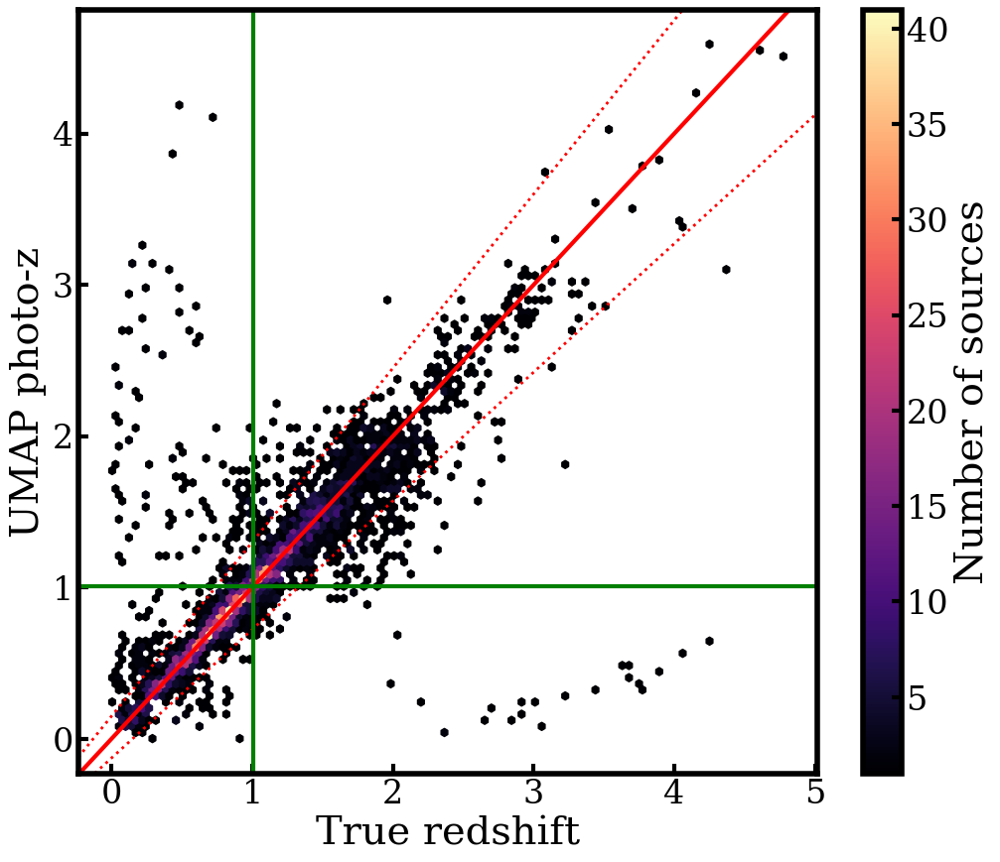

In [73]:
fig = plt.figure()
ax = fig.add_subplot()


mappable = ax.hexbin(REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][10000::10], REDSHIFTS_estimated_WDF_AB[::10],
          mincnt = 1)

ax.set_xlabel("True redshift")
ax.set_ylabel("UMAP photo-z")

ax.axline((0, 0), slope = 1, color = "red")
ax.axline((0.15, 0), slope = .85,  color = "red", linestyle = ":", linewidth = 2)
ax.axline((0, 0.15), slope = 1.15, color = "red", linestyle = ":", linewidth = 2)

ax.axhline(np.median(REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][10000::10]), color = 'green')
ax.axvline(np.median(REDSHIFTS_WideFastDeep[NONnanIDX_UMAP_AB][10000::10]), color = 'green')

fig.colorbar(mappable = mappable, label = "Number of sources")

Text(0.4, 0.47, 'Estimated embedding')

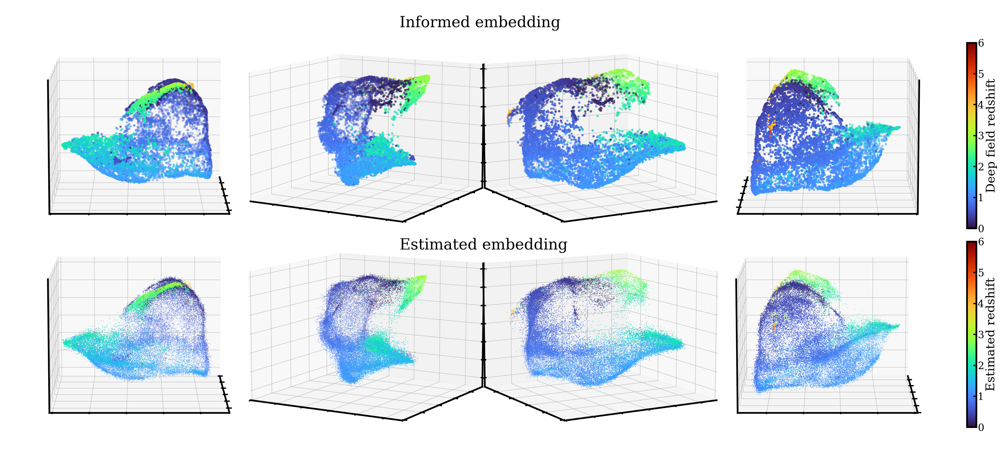

In [72]:
fig = plt.figure(figsize = (36, 16))
gs = fig.add_gridspec(2, 4, wspace = -0.22, hspace = -.25, left = 0.01, right = 0.93, bottom = 0.02, top = 0.98)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_informed_WDF_AB[:, 2], EMBEDDING_informed_WDF_AB[:, 0], -EMBEDDING_informed_WDF_AB[:, 1],
                          c = REDSHIFTS_informed_WDF_AB, s = 20,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Deep field redshift')
fig.text(0.4, 0.93, 'Informed embedding', fontsize = 36)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[1, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_estimated_WDF_AB[:, 2], EMBEDDING_estimated_WDF_AB[:, 0], -EMBEDDING_estimated_WDF_AB[:, 1],
                          c = REDSHIFTS_estimated_WDF_AB, s = 0.5,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Estimated redshift')
fig.text(0.4, 0.47, 'Estimated embedding', fontsize = 36)

# fig.savefig('/Users/leo/Projects/umap_nz_cal/figures/build_UMAP/comparison_w_Ashmead/UMAP_photom.png', bbox_inches = 'tight', dpi = 150)

___

# Experiment: build the UMAP with DeepField photometry in AB magnitudes 

In [2]:
# ----------------------------------------------------------------------------------------------- #
# Section 0: Setup                                                                                #
# ----------------------------------------------------------------------------------------------- #

print("Starting pipeline.")

### Set the date, start the timer
import time
date = "draft_UMAP_fix"
# date = time.strftime('%d%b%y', time.localtime())

def timestamp():
    return(f"[{time.strftime("%H:%M:%S", time.localtime())}]")

def timer(start_time, return_tuple = False):
    elapsed_time = time.time() - start_time

    hours = elapsed_time//3600
    minutes = (elapsed_time//60)%60
    seconds = elapsed_time - 3600 * hours - 60 * minutes
    
    if return_tuple:
        return (hours, minutes, seconds)
    
    if hours > 0:
        return f'{hours:.0f}h {minutes:.0f}m {seconds:.1f}s'
    
    if minutes > 0:
        return f'{minutes:.0f}m {seconds:.1f}s'
    
    return f'{seconds:.1f}s'

start_time = time.time()

print(timestamp(), "Started timer. Importing modules", )

### System imports
import sys, os, shutil
import glob

### I/O imports
import h5py
import tables_io
import pandas as pd

### Operations
import numpy as np

### RAIL imports
from rail.core.data import DataStore, PqHandle, ModelHandle
from rail.core.stage import RailStage

from MultiSurveyErrorModel import MultiSurveyErrorModel
from rail.estimation.algos.flexzboost import FlexZBoostInformer, FlexZBoostEstimator
# from UMAPEstimator import UMAPEstimator

print(timestamp(), "Finished importing modules. Time elapsed: ", timer(start_time))

### Initialize random state
seed = 42
rng = np.random.default_rng(seed = seed)

### Specify outputs directory
outputs_directory = f"/pscratch/sd/s/sajkov/analysis_pipeline/runs/{date}"
os.makedirs(outputs_directory, exist_ok = True)
    
# ----------------------------------------------------------------------------------------------- #
# Section 1: Create datasets                                                                      #
# ----------------------------------------------------------------------------------------------- #

print(timestamp(), "Creating datasets.")

### Specify path to noiseless catalog and redshifts
noiseless_catalog_filepath = "/pscratch/sd/s/sajkov/data/integrated_catalog_23apr26.pq"
redshifts_filepath = "/pscratch/sd/s/sajkov/data/mock_catalog_Ch1_26.h5"

DATASET_popCosmos_full   = tables_io.read(noiseless_catalog_filepath)
with h5py.File(redshifts_filepath) as simulated_catalog:
    REDSHIFTS_popCosmos_full = simulated_catalog['sps_parameters'][:, -1]

### Number of pop-cosmos sources to use in analysis
training_cut   = 10_000   ### Number of sources used to train the estimators
estimation_cut = 50_000   ### Number of sources for which to estimate redshifts

### Randomize full dataset indices
len_DATASET_popCosmos_full = len(DATASET_popCosmos_full)
RANDIDX_popCosmos_full = rng.choice(np.arange(len_DATASET_popCosmos_full),
                                    len_DATASET_popCosmos_full,
                                    replace = False)

RANDIDX_DeepField_full, RANDIDX_WideFastDeep_full = np.array_split(RANDIDX_popCosmos_full, 2)

### 5-sigma limiting depths ------------------
### LSST: median values for COSMOS deep field from https://usdf-maf.slac.stanford.edu/summaryStats?runId=5#Basics_Coadd%20M5
### Roman from https://github.com/jfcrenshaw/photerr/blob/a014b39729ddde3daf80be2dbe82f5a7f958882c/photerr/roman.py#L120-L126
### HSC Niji (60 min exposure) from https://sites.google.com/view/hsc-mb-survey3/filter-specification?authuser=0 
###
### Acessed June 3, 2026
### --------------------------------------------

M5_DEPTHS_DeepField = {'LSST_u'    : 27.74,
                      'LSST_g'    : 28.69,
                      'LSST_r'    : 28.88,
                      'LSST_i'    : 28.96,
                      'LSST_z'    : 28.26,
                      'LSST_y'    : 26.63,}
                    #   'Roman_F062': 27.7,
                    #   'Roman_F087': 27.7,
                    #   'Roman_F106': 27.6,
                    #   'Roman_F129': 27.5,
                    #   'Roman_F158': 27.0,
                    #   'Roman_F184': 25.9,
                    #   'Roman_F213': 28.3,}
                    #   'HSC_MB_00' : 26.41,
                    #   'HSC_MB_01' : 26.51,
                    #   'HSC_MB_02' : 26.45,
                    #   'HSC_MB_03' : 26.69,
                    #   'HSC_MB_04' : 26.93,
                    #   'HSC_MB_05' : 26.62,
                    #   'HSC_MB_06' : 26.26,
                    #   'HSC_MB_07' : 26.02,
                    #   'HSC_MB_08' : 26.07,
                    #   'HSC_MB_09' : 26.00,
                    #   'HSC_MB_10' : 26.06,
                    #   'HSC_MB_11' : 25.52,
                    #   'HSC_MB_12' : 25.58,
                    #   'HSC_MB_13' : 25.43,
                    #   'HSC_MB_14' : 25.15,
                    #   'HSC_MB_15' : 24.79}

iBandLimit_DeepField = 27

### 5-sigma limiting depths for WideFastDeep from https://usdf-maf.slac.stanford.edu/summaryStats?runId=5#Basics_Coadd%20M5
### Column `DD:WFD CoaddM5`
M5_DEPTHS_WideFastDeep = {'LSST_u'    : 25.61,
                          'LSST_g'    : 26.90,
                          'LSST_r'    : 26.87,
                          'LSST_i'    : 26.43,
                          'LSST_z'    : 25.73,
                          'LSST_y'    : 24.79}

iBandLimit_WideFastDeep = 25

### Get list of bands
BANDS_DeepField = list(M5_DEPTHS_DeepField.keys())
ERR_BANDS_DeepField = [f"{key}_err" for key in BANDS_DeepField]

BANDS_WideFastDeep = list(M5_DEPTHS_WideFastDeep.keys())
ERR_BANDS_WideFastDeep = [f"{key}_err" for key in BANDS_WideFastDeep]

### Select needed bands and pick out needed sources
PHOTOMETRY_DeepField_noiseless    = DATASET_popCosmos_full[BANDS_DeepField].iloc[RANDIDX_DeepField_full]
PHOTOMETRY_WideFastDeep_noiseless = DATASET_popCosmos_full[BANDS_WideFastDeep].iloc[RANDIDX_WideFastDeep_full]

### ### Apply noise

### Noising parameters

nYrObs     = 1 # one-year depths
nVisYr     = 1 # one visit/yr (i.e., no co-adds)
gamma      = 0.04
sigLim     = 1 #

seed = 42

### Create: deep, multi-band, medium-band photometry for use in LePhare

print(timestamp(), "Getting noisy deep field photometry in AB magnitudes.")

getNoisyDeepFieldPhotometry = MultiSurveyErrorModel.make_stage(
    name = "getNoisyDeepFieldPhotometry",
    
    inputType  = "pogson",
    outputType = "pogson",
    
    m5     = M5_DEPTHS_DeepField,
    bands  = BANDS_DeepField,
    nYrObs = nYrObs,
    nVisYr = nVisYr,
    gamma  = gamma,
    sigLim = sigLim,
    
    seed = seed
)

getNoisyDeepFieldPhotometry.set_data("noiseless_catalog", PHOTOMETRY_DeepField_noiseless) 
getNoisyDeepFieldPhotometry.run()
PHOTOMETRY_DeepField_noisy_full = getNoisyDeepFieldPhotometry.get_handle("noisy_catalog").data
getNoisyDeepFieldPhotometry.finalize()

iBandCut_DeepField_noisy = PHOTOMETRY_DeepField_noisy_full["LSST_i"] < 27
PHOTOMETRY_DeepField_noisy_iBandCut = PHOTOMETRY_DeepField_noisy_full[iBandCut_DeepField_noisy]
PHOTOMETRY_DeepField_noisy_iBandCut_trainingCut = PHOTOMETRY_DeepField_noisy_iBandCut.iloc[:training_cut]

PHOTOMETRY_DeepField_noisy = PHOTOMETRY_DeepField_noisy_iBandCut_trainingCut
PHOTOMETRY_DeepField_noisy.to_parquet(f"{outputs_directory}/PHOTOMETRY_DeepField_noisy_{date}.pq")

### Create: LSST-like photometry

print(timestamp(), "Getting noisy WideFastDeep photometry in AB magnitudes.")

getNoisyWideFastDeepPhotometry = MultiSurveyErrorModel.make_stage(
    name = "getNoisyWideFastDeepPhotometry",
    
    inputType  = "pogson",
    outputType = "pogson",
    
    m5     = M5_DEPTHS_WideFastDeep,
    bands  = BANDS_WideFastDeep,
    nYrObs = nYrObs,
    nVisYr = nVisYr,
    gamma  = gamma,
    sigLim = sigLim,
    
    seed = seed
)

getNoisyWideFastDeepPhotometry.set_data("noiseless_catalog", PHOTOMETRY_WideFastDeep_noiseless) 
getNoisyWideFastDeepPhotometry.run()
PHOTOMETRY_WideFastDeep_noisy_full = getNoisyWideFastDeepPhotometry.get_handle("noisy_catalog").data
getNoisyWideFastDeepPhotometry.finalize()

iBandCut_WideFastDeep_noisy = PHOTOMETRY_WideFastDeep_noisy_full["LSST_i"] < 25
PHOTOMETRY_WideFastDeep_noisy_iBandCut = PHOTOMETRY_WideFastDeep_noisy_full[iBandCut_WideFastDeep_noisy]
PHOTOMETRY_WideFastDeep_noisy_iBandCut_trainingCut = PHOTOMETRY_WideFastDeep_noisy_iBandCut.iloc[:estimation_cut]

PHOTOMETRY_WideFastDeep_noisy = PHOTOMETRY_WideFastDeep_noisy_iBandCut_trainingCut
PHOTOMETRY_WideFastDeep_noisy.to_parquet(f"{outputs_directory}/PHOTOMETRY_WideFastDeep_noisy_{date}.pq")


### Get source indices
IDX_popCosmos_DeepField             = list(PHOTOMETRY_DeepField_noisy.index)
IDX_popCosmos_WideFastDeep          = list(PHOTOMETRY_WideFastDeep_noisy.index)

### Select relevant redshifts
REDSHIFTS_DeepField                = REDSHIFTS_popCosmos_full[IDX_popCosmos_DeepField]
REDSHIFTS_WideFastDeep             = REDSHIFTS_popCosmos_full[IDX_popCosmos_WideFastDeep]

np.save(f"{outputs_directory}/TRUEREDSHIFTS_DeepField",             REDSHIFTS_DeepField,             allow_pickle = True)   
np.save(f"{outputs_directory}/TRUEREDSHIFTS_WideFastDeep",          REDSHIFTS_WideFastDeep,          allow_pickle = True)         

PHOTOMETRY_DeepField_noisy    = PHOTOMETRY_DeepField_noisy.replace(np.inf, np.nan)
PHOTOMETRY_WideFastDeep_noisy = PHOTOMETRY_WideFastDeep_noisy.replace(np.inf, np.nan)

print(timestamp(), "Finished creating datasets. Time elapsed: ", timer(start_time))

print("------------ Length of datasets ------------")
print(f"Deep field:                    {len(PHOTOMETRY_DeepField_noisy)}")
print(f"WideFastDeep field:            {len(PHOTOMETRY_WideFastDeep_noisy)}")
print("--------------------------------------------")

Starting pipeline.
[16:11:19] Started timer. Importing modules
[16:11:25] Finished importing modules. Time elapsed:  6.6s
[16:11:25] Creating datasets.
column_list None
[16:11:28] Getting noisy deep field photometry in AB magnitudes.
2026-07-08 16:11:28 [info     ] Inserting handle into data store.  noiseless_catalog: None, getNoisyDeepFieldPhotometry
2026-07-08 16:11:30 [info     ] Inserting handle into data store.  noisy_catalog_getNoisyDeepFieldPhotometry: inprogress_noisy_catalog_getNoisyDeepFieldPhotometry.pq, getNoisyDeepFieldPhotometry
[16:11:31] Getting noisy WideFastDeep photometry in AB magnitudes.
2026-07-08 16:11:31 [info     ] Inserting handle into data store.  noiseless_catalog: None, getNoisyWideFastDeepPhotometry
2026-07-08 16:11:33 [info     ] Inserting handle into data store.  noisy_catalog_getNoisyWideFastDeepPhotometry: inprogress_noisy_catalog_getNoisyWideFastDeepPhotometry.pq, getNoisyWideFastDeepPhotometry
[16:11:34] Finished creating datasets. Time elapsed:  15.

In [5]:
from UMAPEstimator import UMAPEstimator

In [3]:
TRAINING_DATA_UMAP = PHOTOMETRY_DeepField_noisy
TRAINING_PHOTOMETRY_UMAP = TRAINING_DATA_UMAP[BANDS_WideFastDeep]
TRAINING_PHOTOMERRS_UMAP = TRAINING_DATA_UMAP[ERR_BANDS_WideFastDeep]

TRAINING_REDSHIFTS_UMAP_specZs  = REDSHIFTS_DeepField

ESTIMATION_DATA_UMAP = PHOTOMETRY_WideFastDeep_noisy

ESTIMATION_PHOTOMETRY_UMAP = ESTIMATION_DATA_UMAP[BANDS_WideFastDeep]
ESTIMATION_PHOTOMERRS_UMAP = ESTIMATION_DATA_UMAP[ERR_BANDS_WideFastDeep]


In [4]:
COLORNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

COLERRNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}_err"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

In [7]:
TRAINING_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

TRAINING_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

In [12]:
NONnanIDX_DeepField    = np.prod(~np.isnan(PHOTOMETRY_DeepField_noisy), axis = 1) == 1
NONnanIDX_WideFastDeep = np.prod(~np.isnan(PHOTOMETRY_WideFastDeep_noisy), axis = 1) == 1

In [16]:
### Set UMAP parameters
ambient_metric_umap = "manhattan_weighted_linear"
n_neighbors_umap    = 80
min_dist            = 0.0

n_neighbors_knn = 10
metric_p_knn   = 2

precision_gauss_kde = 0.01
seed = 42

In [17]:
UMAP_DeepField_AB = UMAPEstimator.make_stage(
    name = "UMAP_DeepField_AB",
    
    ### Specify UMAP parameters
    ambient_metric_umap = ambient_metric_umap,
    
    n_neighbors_umap = n_neighbors_umap,
    min_dist         = min_dist,
    
    n_neighbors_knn = n_neighbors_knn,
    metric_p_knn    = metric_p_knn,
    
    precision_gauss_kde = precision_gauss_kde,
    
    seed = seed
)

UMAP_DeepField_AB.set_data("training_photometry", data = TRAINING_COLORS_UMAP[NONnanIDX_DeepField])
UMAP_DeepField_AB.set_data("training_phot_error", data = TRAINING_COLERRS_UMAP[NONnanIDX_DeepField])
UMAP_DeepField_AB.set_data("training_redshift",   data = TRAINING_REDSHIFTS_UMAP_specZs[NONnanIDX_DeepField])

UMAP_DeepField_AB.UMAP_informer()


2026-07-08 16:15:58 [info     ] Inserting handle into data store.  training_photometry: None, UMAP_DeepField_AB
2026-07-08 16:15:58 [info     ] Inserting handle into data store.  training_phot_error: None, UMAP_DeepField_AB
2026-07-08 16:15:58 [info     ] Inserting handle into data store.  training_redshift: None, UMAP_DeepField_AB


/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1857: UserWarning: custom distance metric does not return gradient; inverse_transform will be unavailable. To enable using inverse_transform method, define a distance function that returns a tuple of (distance [float], gradient [np.array])
  warn(
/global/u1/s/sajkov/.conda/envs/rail/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


2026-07-08 16:16:55 [info     ] Inserting handle into data store.  informed_reducer_UMAP_DeepField_AB: inprogress_informed_reducer_UMAP_DeepField_AB.pkl, UMAP_DeepField_AB
2026-07-08 16:16:55 [info     ] Inserting handle into data store.  informed_embedding_UMAP_DeepField_AB: inprogress_informed_embedding_UMAP_DeepField_AB.pq, UMAP_DeepField_AB
2026-07-08 16:16:55 [info     ] Inserting handle into data store.  informed_kNN_regressor_UMAP_DeepField_AB: inprogress_informed_kNN_regressor_UMAP_DeepField_AB.pkl, UMAP_DeepField_AB


In [18]:
UMAP_DeepField_AB.set_data("estimation_photometry", data = ESTIMATION_COLORS_UMAP[NONnanIDX_WideFastDeep])
UMAP_DeepField_AB.set_data("estimation_phot_error", data = ESTIMATION_COLERRS_UMAP[NONnanIDX_WideFastDeep])
UMAP_DeepField_AB.UMAP_estimator()

2026-07-08 16:16:57 [info     ] Inserting handle into data store.  estimation_photometry: None, UMAP_DeepField_AB
2026-07-08 16:16:57 [info     ] Inserting handle into data store.  estimation_phot_error: None, UMAP_DeepField_AB
2026-07-08 16:21:00 [info     ] Inserting handle into data store.  estimated_embedding_UMAP_DeepField_AB: inprogress_estimated_embedding_UMAP_DeepField_AB.pq, UMAP_DeepField_AB
2026-07-08 16:21:00 [info     ] Inserting handle into data store.  estimated_photoz_medians_UMAP_DeepField_AB: inprogress_estimated_photoz_medians_UMAP_DeepField_AB.pq, UMAP_DeepField_AB
2026-07-08 16:21:00 [info     ] Inserting handle into data store.  estimated_photoz_pdfs_UMAP_DeepField_AB: inprogress_estimated_photoz_pdfs_UMAP_DeepField_AB.hdf5, UMAP_DeepField_AB


In [21]:
EMBEDDING_informed_DeepField_AB = UMAP_DeepField_AB.get_handle("informed_embedding").data.values
REDSHIFTS_informed_DeepField_AB = TRAINING_REDSHIFTS_UMAP_specZs[NONnanIDX_DeepField]

EMBEDDING_estimated_DeepField_AB = UMAP_DeepField_AB.get_handle("estimated_embedding").data.values
REDSHIFTS_estimated_DeepField_AB = UMAP_DeepField_AB.get_handle("estimated_photoz_medians").data["z_phot_median"].values

In [23]:
REDSHIFTS_informed_DeepField_AB

array([0.9499769 , 0.02873397, 0.24080426, ..., 0.9742268 , 1.4976344 ,
       1.3036196 ], shape=(8928,), dtype=float32)

In [ ]:
REDSHIFTS_estimated_DeepField_AB

array([0.51, 1.89, 0.96, ..., 0.94, 0.96, 0.83], shape=(45110,))

In [26]:
def outlier_frac(z_pred, z_true):
    
    delta_z = z_pred - z_true
    
    return (np.abs(delta_z)/(1 + z_true) > 0.15).sum()/len(delta_z)

def sigma_nmad(z_pred, z_true):
    
    delta_z = z_pred - z_true
    
    return 1.4826 * np.median(np.abs((delta_z/(1 + z_true)) - np.median(delta_z/(1 + z_true))))
    
def prediction_bias(z_pred, z_true):
    
    delta_z = z_pred - z_true
    
    return np.mean(delta_z/(1 + z_true))

In [27]:
print("Outlier frac", outlier_frac(REDSHIFTS_estimated_DeepField_AB, REDSHIFTS_WideFastDeep[NONnanIDX_WideFastDeep]))
print("Sigma NMAD", sigma_nmad(REDSHIFTS_estimated_DeepField_AB, REDSHIFTS_WideFastDeep[NONnanIDX_WideFastDeep]))
print("Prediction bias", prediction_bias(REDSHIFTS_estimated_DeepField_AB, REDSHIFTS_WideFastDeep[NONnanIDX_WideFastDeep]))

Outlier frac 0.12992684548880515
Sigma NMAD 0.04745069022309773
Prediction bias 0.053568258166020774


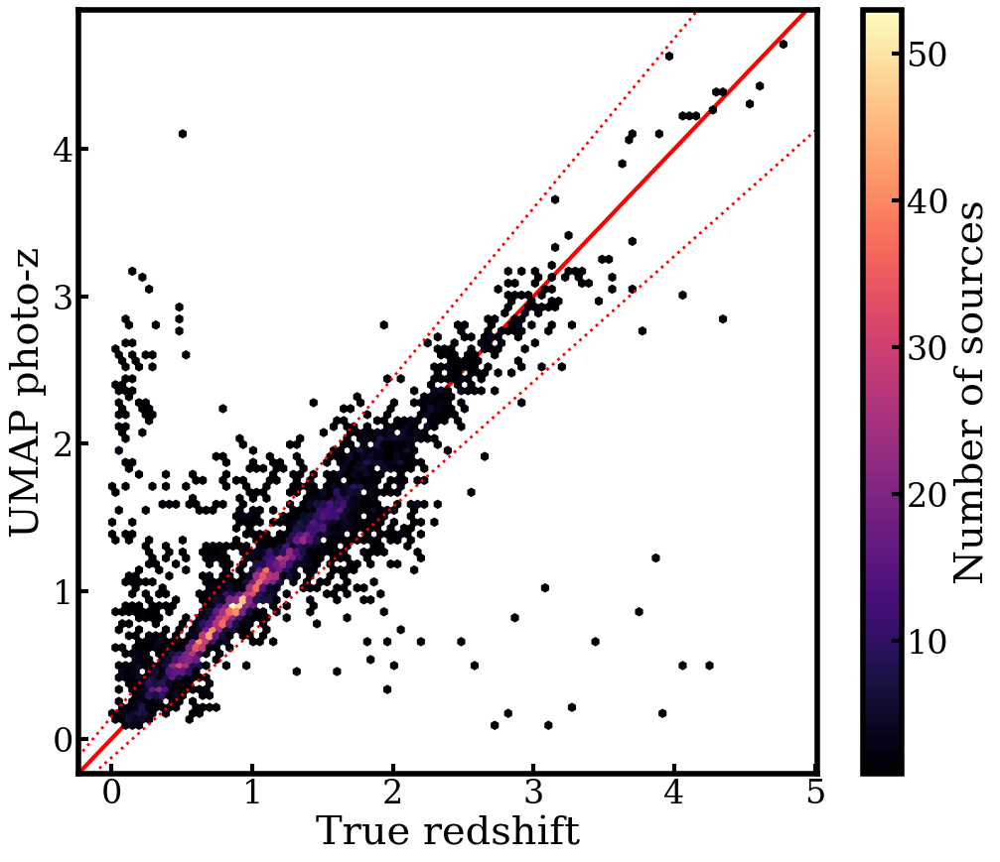

In [33]:
fig = plt.figure()
ax = fig.add_subplot()


mappable = ax.hexbin(REDSHIFTS_WideFastDeep[NONnanIDX_WideFastDeep][::10], REDSHIFTS_estimated_DeepField_AB[::10],
          mincnt = 1)

ax.set_xlabel("True redshift")
ax.set_ylabel("UMAP photo-z")

ax.axline((0, 0), slope = 1, color = "red", zorder = 0)
ax.axline((0.15, 0), slope = .85,  color = "red", linestyle = ":", linewidth = 2)
ax.axline((0, 0.15), slope = 1.15, color = "red", linestyle = ":", linewidth = 2)

# ax.axhline(np.median(REDSHIFTS_WideFastDeep[NONnanIDX_WideFastDeep][::10]), color = 'green')
# ax.axvline(np.median(REDSHIFTS_WideFastDeep[NONnanIDX_WideFastDeep][::10]), color = 'green')

fig.colorbar(mappable = mappable, label = "Number of sources")

Text(0.4, 0.47, 'Estimated embedding')

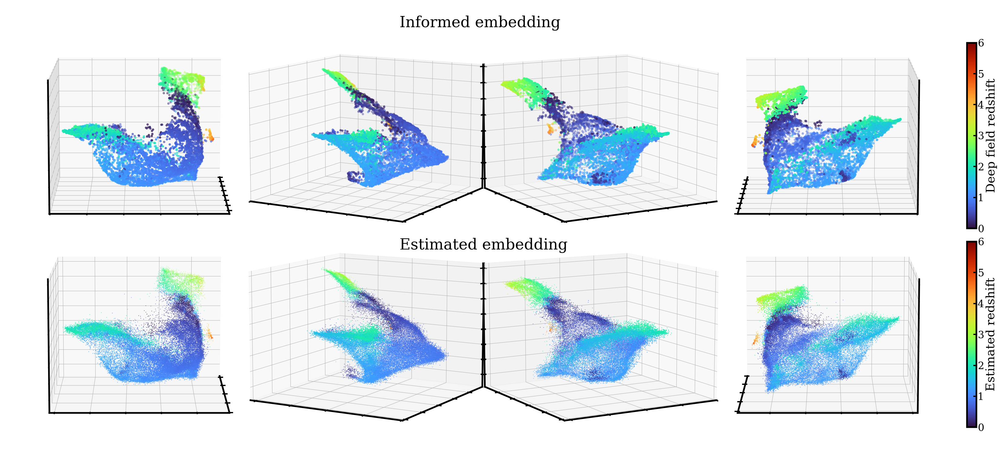

In [32]:
fig = plt.figure(figsize = (36, 16))
gs = fig.add_gridspec(2, 4, wspace = -0.22, hspace = -.25, left = 0.01, right = 0.93, bottom = 0.02, top = 0.98)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_informed_DeepField_AB[:, 2], EMBEDDING_informed_DeepField_AB[:, 0], -EMBEDDING_informed_DeepField_AB[:, 1],
                          c = REDSHIFTS_informed_DeepField_AB, s = 20,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Deep field redshift')
fig.text(0.4, 0.93, 'Informed embedding', fontsize = 36)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[1, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING_estimated_DeepField_AB[:, 2], EMBEDDING_estimated_DeepField_AB[:, 0], -EMBEDDING_estimated_DeepField_AB[:, 1],
                          c = REDSHIFTS_estimated_DeepField_AB, s = 0.5,
            cmap = 'turbo', vmin = 0, vmax = 6)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Estimated redshift')
fig.text(0.4, 0.47, 'Estimated embedding', fontsize = 36)

# fig.savefig('/Users/leo/Projects/umap_nz_cal/figures/build_UMAP/comparison_w_Ashmead/UMAP_photom.png', bbox_inches = 'tight', dpi = 150)

___

In [ ]:
fig = plt.figure(figsize = (36, 16))
gs = fig.add_gridspec(1, 4, wspace = -0.1, hspace = -.25, left = 0.01, right = 0.93, bottom = 0.02, top = 0.98)

axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i], projection = '3d')
    axes.append(ax)
    mappable = ax.scatter(EMBEDDING[:, 2], EMBEDDING[:, 0], -EMBEDDING[:, 1], c = REDSHIFTS, s = 20,
            cmap = 'turbo', vmin = 0, vmax = 5)
    ax.view_init(10, -i*60, 0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.patch.set_alpha(0)

# fig.subplots_adjust(wspace = -0.05)
fig.colorbar(mappable = mappable, ax = axes, location = 'right', pad = 0.01, fraction = 0.01, shrink = 0.7, label = 'Redshift')


In [ ]:
TRAINING_DATA_UMAP = PHOTOMETRY_DeepField_noisy

TRAINING_PHOTOMETRY_UMAP = TRAINING_DATA_UMAP[BANDS_WideFastDeep]
TRAINING_PHOTOMERRS_UMAP = TRAINING_DATA_UMAP[ERR_BANDS_WideFastDeep]

TRAINING_REDSHIFTS_UMAP_specZs  = REDSHIFTS_DeepField
TRAINING_REDSHIFTS_UMAP_photoZs = PHOTOZS_DeepField_lephare

ESTIMATION_DATA_UMAP = PHOTOMETRY_WideFastDeep_noisy

ESTIMATION_PHOTOMETRY_UMAP = ESTIMATION_DATA_UMAP[BANDS_WideFastDeep]
ESTIMATION_PHOTOMERRS_UMAP = ESTIMATION_DATA_UMAP[ERR_BANDS_WideFastDeep]

COLORNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

COLERRNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}_err"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

TRAINING_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

TRAINING_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

TRAINING_COLORS_UMAP.to_parquet(f"{outputs_directory}/TRAINING_COLORS_UMAP{date}.pq")
TRAINING_COLERRS_UMAP.to_parquet(f"{outputs_directory}/TRAINING_COLERRS_UMAP{date}.pq")
ESTIMATION_COLORS_UMAP.to_parquet(f"{outputs_directory}/ESTIMATION_COLORS_UMAP{date}.pq")
ESTIMATION_COLERRS_UMAP.to_parquet(f"{outputs_directory}/ESTIMATION_COLERRS_UMAP{date}.pq")

print(timestamp(), "Prepared input data for UMAPs. Time elapsed: ", timer(start_time))

In [ ]:

# ----------------------------------------------------------------------------------------------- #
# Section 3: Estimate redshfits with UMAPs                                                        #
# ----------------------------------------------------------------------------------------------- #

print(timestamp(), "Preparing input data for UMAPs")

### Prepare input data
TRAINING_DATA_UMAP = PHOTOMETRY_DeepField_noisy

TRAINING_PHOTOMETRY_UMAP = TRAINING_DATA_UMAP[BANDS_WideFastDeep]
TRAINING_PHOTOMERRS_UMAP = TRAINING_DATA_UMAP[ERR_BANDS_WideFastDeep]

TRAINING_REDSHIFTS_UMAP_specZs  = REDSHIFTS_DeepField
TRAINING_REDSHIFTS_UMAP_photoZs = PHOTOZS_DeepField_lephare

ESTIMATION_DATA_UMAP = PHOTOMETRY_WideFastDeep_noisy

ESTIMATION_PHOTOMETRY_UMAP = ESTIMATION_DATA_UMAP[BANDS_WideFastDeep]
ESTIMATION_PHOTOMERRS_UMAP = ESTIMATION_DATA_UMAP[ERR_BANDS_WideFastDeep]

COLORNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

COLERRNAMES_WideFastDeep = [f"{BANDS_WideFastDeep[i].split('_')[-1]}-{BANDS_WideFastDeep[i + 1].split('_')[-1]}_err"
                           for i in range(len(BANDS_WideFastDeep) - 1)]

TRAINING_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - TRAINING_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

TRAINING_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + TRAINING_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLORS_UMAP = pd.DataFrame(
    {COLORNAMES_WideFastDeep[i]:
        ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i]] - ESTIMATION_PHOTOMETRY_UMAP[BANDS_WideFastDeep[i + 1]]
            for i in range(len(BANDS_WideFastDeep) - 1)}
)

ESTIMATION_COLERRS_UMAP = pd.DataFrame(
    {COLERRNAMES_WideFastDeep[i]:
        np.clip(np.sqrt(ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i]]**2 + ESTIMATION_PHOTOMERRS_UMAP[ERR_BANDS_WideFastDeep[i + 1]]**2),
                None, 0.05)
            for i in range(len(ERR_BANDS_WideFastDeep) - 1)}
)

TRAINING_COLORS_UMAP.to_parquet(f"{outputs_directory}/TRAINING_COLORS_UMAP{date}.pq")
TRAINING_COLERRS_UMAP.to_parquet(f"{outputs_directory}/TRAINING_COLERRS_UMAP{date}.pq")
ESTIMATION_COLORS_UMAP.to_parquet(f"{outputs_directory}/ESTIMATION_COLORS_UMAP{date}.pq")
ESTIMATION_COLERRS_UMAP.to_parquet(f"{outputs_directory}/ESTIMATION_COLERRS_UMAP{date}.pq")

print(timestamp(), "Prepared input data for UMAPs. Time elapsed: ", timer(start_time))

print(timestamp(), "Building, and getting redshifts from, spec-z UMAP")

### Set UMAP parameters
ambient_metric_umap = "manhattan_weighted_linear"
n_neighbors_umap    = 80
min_dist            = 0.0

n_neighbors_knn = 10
metric_p_knn   = 2

precision_gauss_kde = 0.01

### Buld a UMAP from the training photometry, colored with spectrosopic redshifts
informedReducerPath_UMAP_wSpecZs      = f"{outputs_directory}/informedReducer_UMAP_wSpecZs_{date}.pkl"
informedEmbeddingPath_UMAP_wSpecZs    = f"{outputs_directory}/informedEmbedding_UMAP_wSpecZs_{date}.pq"
informedkNNRegressorPath_UMAP_wSpecZs = f"{outputs_directory}/informedkNNRegressor_UMAP_wSpecZs_{date}.pkl"

estimatedEmbeddingPath_UMAP_wSpecZs     = f"{outputs_directory}/estimatedEmbedding_UMAP_wSpecZs_{date}.pq"
estimatedPhotoZMediansPath_UMAP_wSpecZs = f"{outputs_directory}/estimatedPhotoZMedians_UMAP_wSpecZs_{date}.pq"
estimatedPhotoZPDFsPath_UMAP_wSpecZs    = f"{outputs_directory}/estimatedPhotoZPDFs_UMAP_wSpecZs_{date}.hdf5"

estimatePhotozsUMAP_wSpecZs = UMAPEstimator.make_stage(
    name = "estimatePhotozsUMAP_wSpecZs",

    ### Specify paths
    informed_reducer       = informedReducerPath_UMAP_wSpecZs,
    informed_embedding     = informedEmbeddingPath_UMAP_wSpecZs,
    informed_kNN_regressor = informedkNNRegressorPath_UMAP_wSpecZs,

    estimated_embedding      = estimatedEmbeddingPath_UMAP_wSpecZs,
    estimated_photoz_medians = estimatedPhotoZMediansPath_UMAP_wSpecZs,
    estimated_photoz_pdfs    = estimatedPhotoZPDFsPath_UMAP_wSpecZs,

    ### Specify UMAP parameters
    ambient_metric_umap = ambient_metric_umap,
    
    n_neighbors_umap = n_neighbors_umap,
    min_dist         = min_dist,
    
    n_neighbors_knn = n_neighbors_knn,
    metric_p_knn    = metric_p_knn,
    
    precision_gauss_kde = precision_gauss_kde,
    
    seed = seed
)

estimatePhotozsUMAP_wSpecZs.set_data("training_photometry", data = TRAINING_COLORS_UMAP)
estimatePhotozsUMAP_wSpecZs.set_data("training_phot_error", data = TRAINING_COLERRS_UMAP)
estimatePhotozsUMAP_wSpecZs.set_data("training_redshift",   data = TRAINING_REDSHIFTS_UMAP_specZs)

estimatePhotozsUMAP_wSpecZs.UMAP_informer()

estimatePhotozsUMAP_wSpecZs.set_data("estimation_photometry", data = ESTIMATION_COLORS_UMAP)
estimatePhotozsUMAP_wSpecZs.set_data("estimation_phot_error", data = ESTIMATION_COLERRS_UMAP)
estimatePhotozsUMAP_wSpecZs.UMAP_estimator()

estimatePhotozsUMAP_wSpecZs.get_handle("informed_reducer").write()
estimatePhotozsUMAP_wSpecZs.get_handle("informed_embedding").write()
estimatePhotozsUMAP_wSpecZs.get_handle("informed_kNN_regressor").write()
estimatePhotozsUMAP_wSpecZs.get_handle("estimated_embedding").write()
estimatePhotozsUMAP_wSpecZs.get_handle("estimated_photoz_medians").write()
estimatePhotozsUMAP_wSpecZs.get_handle("estimated_photoz_pdfs").write()

PHOTOZS_estimated_wSpecZs = estimatePhotozsUMAP_wSpecZs.get_handle("estimated_photoz_medians").data
estimatePhotozsUMAP_wSpecZs.finalize()

print(timestamp(), "Built, and got photo-zs from, spec-z UMAP. Time elapsed: ", timer(start_time))

print(timestamp(), "Building, and getting redshifts from, photoz-z UMAP")

### Buld a UMAP from the training photometry, colored with the photometric redshifts from LePhare
informedReducerPath_UMAP_wPhotoZs      = f"{outputs_directory}/informedReducer_UMAP_wPhotoZs_{date}.pkl"
informedEmbeddingPath_UMAP_wPhotoZs    = f"{outputs_directory}/informedEmbedding_UMAP_wPhotoZs_{date}.pq"
informedkNNRegressorPath_UMAP_wPhotoZs = f"{outputs_directory}/informedkNNRegressor_UMAP_wPhotoZs_{date}.pkl"

estimatedEmbeddingPath_UMAP_wPhotoZs     = f"{outputs_directory}/estimatedEmbedding_UMAP_wPhotoZs_{date}.pq"
estimatedPhotoZMediansPath_UMAP_wPhotoZs = f"{outputs_directory}/estimatedPhotoZMedians_UMAP_wPhotoZs_{date}.pq"
estimatedPhotoZPDFsPath_UMAP_wPhotoZs    = f"{outputs_directory}/estimatedPhotoZPDFs_UMAP_wPhotoZs_{date}.hdf5"

estimatePhotozsUMAP_wPhotoZs = UMAPEstimator.make_stage(
    name = "estimatePhotozsUMAP_wPhotoZs",

    ### Specify paths
    informed_reducer       = informedReducerPath_UMAP_wPhotoZs,
    informed_embedding     = informedEmbeddingPath_UMAP_wPhotoZs,
    informed_kNN_regressor = informedkNNRegressorPath_UMAP_wPhotoZs,

    estimated_embedding      = estimatedEmbeddingPath_UMAP_wPhotoZs,
    estimated_photoz_medians = estimatedPhotoZMediansPath_UMAP_wPhotoZs,
    estimated_photoz_pdfs    = estimatedPhotoZPDFsPath_UMAP_wPhotoZs,

    ### Specify UMAP parameters
    ambient_metric_umap = ambient_metric_umap,
    
    n_neighbors_umap = n_neighbors_umap,
    min_dist         = min_dist,
    
    n_neighbors_knn = n_neighbors_knn,
    metric_p_knn    = metric_p_knn,
    
    precision_gauss_kde = precision_gauss_kde,
    
    seed = seed
)

estimatePhotozsUMAP_wPhotoZs.set_data("training_photometry", data = TRAINING_PHOTOMETRY_UMAP)
estimatePhotozsUMAP_wPhotoZs.set_data("training_phot_error", data = TRAINING_PHOTOMERRS_UMAP)
estimatePhotozsUMAP_wPhotoZs.set_data("training_redshift",   data = TRAINING_REDSHIFTS_UMAP_photoZs)

estimatePhotozsUMAP_wPhotoZs.UMAP_informer()

estimatePhotozsUMAP_wPhotoZs.set_data("estimation_photometry", data = ESTIMATION_PHOTOMETRY_UMAP)
estimatePhotozsUMAP_wPhotoZs.set_data("estimation_phot_error", data = ESTIMATION_PHOTOMERRS_UMAP)
estimatePhotozsUMAP_wPhotoZs.UMAP_estimator()

estimatePhotozsUMAP_wPhotoZs.get_handle("informed_reducer").write()
estimatePhotozsUMAP_wPhotoZs.get_handle("informed_embedding").write()
estimatePhotozsUMAP_wPhotoZs.get_handle("informed_kNN_regressor").write()
estimatePhotozsUMAP_wPhotoZs.get_handle("estimated_embedding").write()
estimatePhotozsUMAP_wPhotoZs.get_handle("estimated_photoz_medians").write()
estimatePhotozsUMAP_wPhotoZs.get_handle("estimated_photoz_pdfs").write()

PHOTOZS_estimated_wPhotoZs = estimatePhotozsUMAP_wPhotoZs.get_handle("estimated_photoz_medians").data
estimatePhotozsUMAP_wPhotoZs.finalize()

print(timestamp(), "Built, and got photo-zs from, photo-z UMAP. Time elapsed: ", timer(start_time))

print("Pipeline finished.")